# University of North Carolina at Charlotte
# ITCS 5111 Natural Language Processing

# Group 22
## Instructor
- Dr. Samira Shaikh

## Team Members                                               
- Mohammed Hussain Musthaq Syed Nizam Babu                                                       
- Muthu Priya Shanmugakani Velsamy

# Data Source
The dataset is acquired from Kaggle competition "COVID-19 Open Research Dataset Challenge (CORD-19)"

Link to the dataset: https://www.kaggle.com/allen-institute-for-ai/CORD-19-research-challenge

# Data Description
This dataset was created by the Allen Institute for AI in partnership with the Chan Zuckerberg Initiative, Georgetown University’s Center for Security and Emerging Technology, Microsoft Research, IBM, and the National Library of Medicine - National Institutes of Health, in coordination with The White House Office of Science and Technology Policy. This is a periodically updated dataset and as of now it is of 21.27 GB.

### Dataset Summary 
* Total metadata rows: 341713 CORD UIDs 
* Full text: 
    - PDF - 128924 json files
    - PMC - 93581 json files

In [1]:
## Import all required libraries
import numpy as np 
import pandas as pd 
import json
import os
from tqdm import tqdm,tqdm_notebook
#from IPython.core.display import display, HTML
import gc
torch_device="cuda"
# import glob

# Fetch the Dataset from Kaggle

In [2]:
# # Fetching metadata.csv file from Kaggle
# root_path = '/kaggle/input/CORD-19-research-challenge/'
# metadata_path = f'{root_path}/metadata.csv'
# meta_df = pd.read_csv(metadata_path, dtype={
#     'pubmed_id': str,
#     'Microsoft Academic Paper ID': str, 
#     'doi': str
# })
# meta_df.head()

In [3]:
# # Display columns in dataset along with data type
# meta_df.info()

In [4]:
# # Fetching all the json files from Kaggle which contains research papers
# all_json_files = glob.glob(f'{root_path}/**/*.json', recursive=True)
# len(all_json_files)

In [5]:
import os, json
import pandas as pd

# this finds our json files
path_to_json = '/kaggle/input/CORD-19-research-challenge/document_parses/pdf_json'
json_files = [pos_json for pos_json in os.listdir(path_to_json) if pos_json.endswith('.json')]
json_files

# all_json_files = glob.glob(f'{root_path}/**/*.json', recursive=True)
# len(all_json_files)


['a0d063dca746b135afe0451ce0b3bb1e06cf15ae.json',
 'edb294108440787c9f074483fd3c953a83e53622.json',
 'a0bc6bc5b8547b98a2d77b81ca81cb18fa1b7ee9.json',
 '6b9d9eb2e9f448a5d2b3646b37b16534211cb3ff.json',
 '961458c62b1ac196cf312994ff02e5edbd6a1c6a.json',
 'c79ce955bfc71ffe8159bca6bc81d783a86d8edf.json',
 '5b17ddde53fd62a102981cec25dc581a27bfbfdb.json',
 'ffb0bc200097adb7dc05e011b1690ee6e08e1b87.json',
 'be9bdbb4987a83ad38fb0b65018528055e13eab7.json',
 '86b54363453c4ded55b68fb59179ddac57db4596.json',
 'acfb6e59bf5f762b7a749c4bdc3613360fdc2160.json',
 'fcb1c4ac23381ffb7dbeaad05aa5307cf4386912.json',
 '4f56c3f8ce546edfee88978ec4d38e76b046a2ab.json',
 'd2c1f7ac4c0683dd24d294a91600b464c4800f5d.json',
 'be5efc90a7e5e4cb3ba27f554d2af1f6269fce46.json',
 '027f8f76befbba9545cd612d08fcb5ed503a7114.json',
 '90ce0189f301119a51f8e39bab4db519670d2e98.json',
 '97acf17564239fe170cc68c9514daf5909f7d999.json',
 '9e277d3a38ec5bf379b333d675963086ee32e9f2.json',
 '3cfc7674f189b49a38eacfb52d12f6e3d5d36f98.json',


In [6]:
len(json_files)

138912

In [7]:
# here I define my pandas Dataframe with the columns I want to get from the json
# jsons_data = pd.DataFrame(columns=['country', 'city', 'long/lat'])
jsons_data = pd.DataFrame(columns=['paper_id', 'abstract', 'body_text'])

id2abstract = []
id2body = []
# we need both the json and an index number so use enumerate()
for index, js in enumerate(json_files[:1389]):
    with open(os.path.join(path_to_json, js)) as json_file:
        json_text = json.load(json_file)

        # here you need to know the layout of your json and each json has to have
        # the same structure (obviously not the structure I have here)
        paper_id = json_text['paper_id']
#         abstract = json_text['abstract'][0]['text']
        abstract=''
        for entry in json_text['abstract']:
                abstract += entry['text']
        id2abstract.append({paper_id:abstract})
                #abstract.append(entry['text'])
        body_text=""
        for entry in json_text['body_text']:
                body_text += entry['text']
                id2body.append({paper_id:body_text})
                #body_text.append(entry['text'])
                
        # here I push a list of data into a pandas DataFrame at row given by 'index'
        jsons_data.loc[index] = [paper_id, abstract, body_text]

# now that we have the pertinent json data in our DataFrame let's look at it
print(jsons_data)

                                      paper_id  \
0     a0d063dca746b135afe0451ce0b3bb1e06cf15ae   
1     edb294108440787c9f074483fd3c953a83e53622   
2     a0bc6bc5b8547b98a2d77b81ca81cb18fa1b7ee9   
3     6b9d9eb2e9f448a5d2b3646b37b16534211cb3ff   
4     961458c62b1ac196cf312994ff02e5edbd6a1c6a   
...                                        ...   
1384  ddb7090314e89cfc001186101093a15896ba3b43   
1385  bf5f9a9d02f4fd2e5c62967e71b26adfaf5e81b3   
1386  60b4a038e26fe49a25257478eb1a97408e4228f7   
1387  20566d87a38faecb36be05390d579a85d7142013   
1388  2a40a48b3caeb8d8e432a1d885851d37233c078d   

                                               abstract  \
0     Background Brazil ranks second worldwide in to...   
1                                                         
2                                                         
3     Coronavirus disease 2019 is a global pandemic ...   
4                                                         
...                                          

In [8]:
id2abstract

[{'a0d063dca746b135afe0451ce0b3bb1e06cf15ae': 'Background Brazil ranks second worldwide in total number of COVID-19 cases and deaths. Understanding the possible socioeconomic and ethnic health inequities is particularly important given the diverse population and fragile political and economic situation. We aimed to characterise the COVID-19 pandemic in Brazil and assess variations in mortality according to region, ethnicity, comorbidities, and symptoms.Methods We conducted a cross-sectional observational study of COVID-19 hospital mortality using data from the SIVEP-Gripe (Sistema de Informação de Vigilância Epidemiológica da Gripe) dataset to characterise the COVID-19 pandemic in Brazil. In the study, we included hospitalised patients who had a positive RT-PCR test for severe acute respiratory syndrome coronavirus 2 and who had ethnicity information in the dataset. Ethnicity of participants was classified according to the five categories used by the Brazilian Institute of Geography an

In [9]:
#id2body

In [10]:
jsons_data

,paper_id,abstract,body_text
0,a0d063dca746b135afe0451ce0b3bb1e06cf15ae,Background Brazil ranks second worldwide in to...,The COVID-19 pandemic has created an unprecede...
1,edb294108440787c9f074483fd3c953a83e53622,,Die Corona-Pandemie ist eine Gefahr für die Ge...
2,a0bc6bc5b8547b98a2d77b81ca81cb18fa1b7ee9,,"To the editor, We read with great interest the..."
3,6b9d9eb2e9f448a5d2b3646b37b16534211cb3ff,Coronavirus disease 2019 is a global pandemic ...,Forces beyond your control can take away every...
4,961458c62b1ac196cf312994ff02e5edbd6a1c6a,,"civil and state cohesion, prosperity and power..."
...,...,...,...
1384,ddb7090314e89cfc001186101093a15896ba3b43,"Human factors engineering (HFE), with its focu...",To prevent healthcare-associated infections (H...
1385,bf5f9a9d02f4fd2e5c62967e71b26adfaf5e81b3,,Pneumonia is a leading complication and cause ...
1386,60b4a038e26fe49a25257478eb1a97408e4228f7,,"Issues relating to chronic diseases, including..."
1387,20566d87a38faecb36be05390d579a85d7142013,,"To the Editor,The coronavirus disease , which ..."


In [11]:
df = jsons_data

In [12]:
# Describe the New processed Dataframe
df.describe()

,paper_id,abstract,body_text
count,1389,1389,1389
unique,1389,986,1389
top,06a8d103c958a839e78230af0ad95f9e868114bc,,The COVID-19 pandemic has fundamentally altere...
freq,1,404,1


In [13]:
# # Converting the columns in list to string for easy processing of the columns while tokenising
# df['abstract'] = [' '.join(map(str, l)) for l in df['abstract']]
# df['body_text'] = [' '.join(map(str, l)) for l in df['body_text']]
# df.head()

## Word count

In [14]:
# Count of all tokens in the columns and unique words in the columns
df['abstract_word_count'] = df['abstract'].apply(lambda x: len(x.strip().split()))  # word count in abstract
df['body_word_count'] = df['body_text'].apply(lambda x: len(x.strip().split()))  # word count in body
df['body_unique_words']=df['body_text'].apply(lambda x:len(set(str(x).split())))  # number of unique words in body
df.head()

,paper_id,abstract,body_text,abstract_word_count,body_word_count,body_unique_words
0,a0d063dca746b135afe0451ce0b3bb1e06cf15ae,Background Brazil ranks second worldwide in to...,The COVID-19 pandemic has created an unprecede...,372,4086,1298
1,edb294108440787c9f074483fd3c953a83e53622,,Die Corona-Pandemie ist eine Gefahr für die Ge...,0,2411,1263
2,a0bc6bc5b8547b98a2d77b81ca81cb18fa1b7ee9,,"To the editor, We read with great interest the...",0,94,76
3,6b9d9eb2e9f448a5d2b3646b37b16534211cb3ff,Coronavirus disease 2019 is a global pandemic ...,Forces beyond your control can take away every...,208,2841,1110
4,961458c62b1ac196cf312994ff02e5edbd6a1c6a,,"civil and state cohesion, prosperity and power...",0,5234,1869


## Check NULL Values

In [15]:
# Check if NULL values are present in the dataset along with count of the NULL values
for col in df.columns:
    print(col, df[col].isnull().sum())

paper_id 0
abstract 0
body_text 0
abstract_word_count 0
body_word_count 0
body_unique_words 0


## Delete all rows for whose word count is 0

In [16]:
# Thanks to https://www.codegrepper.com/code-examples/delphi/delete+rows+pandas+if+column+contains
# Thanks to https://stackoverflow.com/questions/49841989/python-drop-value-0-row-in-specific-columns

# Let’s delete all rows for whose word count is 0
df.drop(df.index[df['abstract_word_count'] == 0], inplace = True)
df.drop(df.index[df['body_word_count'] == 0], inplace = True)
# df = df.loc[~((df['abstract_word_count'] == 0) | (df['body_word_count'] == 0))]
df
print(len(df))

985


## Lower Case

In [17]:
# Converting strings to Lower case
df["abstract"] = df["abstract"].str.lower() 
df["body_text"] = df["body_text"].str.lower() 
df.head(10)

,paper_id,abstract,body_text,abstract_word_count,body_word_count,body_unique_words
0,a0d063dca746b135afe0451ce0b3bb1e06cf15ae,background brazil ranks second worldwide in to...,the covid-19 pandemic has created an unprecede...,372,4086,1298
3,6b9d9eb2e9f448a5d2b3646b37b16534211cb3ff,coronavirus disease 2019 is a global pandemic ...,forces beyond your control can take away every...,208,2841,1110
5,c79ce955bfc71ffe8159bca6bc81d783a86d8edf,the asymptomatic novel coronavirus infection (...,the world health organization first declared a...,261,1089,509
8,be9bdbb4987a83ad38fb0b65018528055e13eab7,aims/hypothesis transmembrane protein 27 (tmem...,type 2 diabetes is a complex disease that pres...,243,4445,1531
10,acfb6e59bf5f762b7a749c4bdc3613360fdc2160,the purpose of this study was to assess the pe...,in the midst of a global covid-19 pandemic (wo...,225,7146,2382
11,fcb1c4ac23381ffb7dbeaad05aa5307cf4386912,virus is known to resonate in the confined-aco...,"in the past few decades, tremendous efforts ha...",151,5438,1553
12,4f56c3f8ce546edfee88978ec4d38e76b046a2ab,matrix metalloproteinases (mmps)-induced alter...,cancer stands next to cardiovascular disease a...,243,3379,1383
14,be5efc90a7e5e4cb3ba27f554d2af1f6269fce46,| seasonal influenza vaccines lack efficacy ag...,vaccination represents an efficient and cost-e...,107,7101,2195
15,027f8f76befbba9545cd612d08fcb5ed503a7114,the aim of this study was to evaluate the conc...,airborne and droplet transmission are one of t...,232,2493,850
17,97acf17564239fe170cc68c9514daf5909f7d999,"singanayagam a, inhaled corticosteroids downre...",widely used in copd but the extent to which th...,81,1273,551


## Stop Words

In [18]:
### load stopwords 
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /usr/share/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [19]:
# Thanks to https://medium.com/analytics-vidhya/text-summarization-on-covid-19-research-data-a5ab28695e11

stopwords_custom = nltk.corpus.stopwords.words('english')
customize_stop_words = ['common','review','describes','abstract','retrospective','chart','patients','study','may',
                        'associated','results','including','high''found','one','well','among','Abstract','provide',
                        'objective','objective:','background','range','features','participates','doi', 'preprint', 
                        'copyright', 'org', 'https', 'et ','et' 'al', 'author', 'figure', 'table', 'rights', 'reserved', 
                        'permission', 'use', 'used', 'using', 'biorxiv', 'medrxiv', 'license', 'fig', 'fig.', 'al.', 
                        'Elsevier', 'PMC', 'CZI']
### append custom stopwords to default stopwords from NLTK
for i in customize_stop_words:
    stopwords_custom.append(i)

In [20]:
df['abstract'] = df['abstract'].apply(lambda x: " ".join([word for word in x.split() if word not in (stopwords_custom)]))
df['body_text'] = df['body_text'].apply(lambda x: " ".join([word for word in x.split() if word not in (stopwords_custom)]))
df

,paper_id,abstract,body_text,abstract_word_count,body_word_count,body_unique_words
0,a0d063dca746b135afe0451ce0b3bb1e06cf15ae,brazil ranks second worldwide total number cov...,covid-19 pandemic created unprecedented worldw...,372,4086,1298
3,6b9d9eb2e9f448a5d2b3646b37b16534211cb3ff,coronavirus disease 2019 global pandemic affec...,forces beyond control take away everything pos...,208,2841,1110
5,c79ce955bfc71ffe8159bca6bc81d783a86d8edf,asymptomatic novel coronavirus infection (acor...,world health organization first declared pande...,261,1089,509
8,be9bdbb4987a83ad38fb0b65018528055e13eab7,aims/hypothesis transmembrane protein 27 (tmem...,type 2 diabetes complex disease presents beta ...,243,4445,1531
10,acfb6e59bf5f762b7a749c4bdc3613360fdc2160,purpose assess perceptions attitudes south car...,midst global covid-19 pandemic (world health o...,225,7146,2382
...,...,...,...,...,...,...
1380,3ff5be8154bed1e54b0774d3863c375e97ea70fe,la stéatohépatite non-alcoolique (nash) est un...,la maladie stéatosique non-alcoolique du foie ...,447,2919,1128
1381,5eeca2a28e7dc3e0a4a65f80dc2d331e6c78c1ba,predicting susceptibility various species viru...,"establishment susceptibility, evaluation forme...",91,1517,511
1383,0b65341c3090421acaac37ec4c93212277be55bb,african swine fever (asf) pathology pigs treat...,african swine fever virus (asfv) causal agent ...,319,5356,1726
1384,ddb7090314e89cfc001186101093a15896ba3b43,"human factors engineering (hfe), focus studyin...",prevent healthcare-associated infections (hais...,221,5813,1835


## Contraction Words

In [21]:
# Installing the Contractions Package
!pip install contractions

     |████████████████████████████████| 312 kB 827 kB/s eta 0:00:01
  Created wheel for pyahocorasick: filename=pyahocorasick-1.4.0-cp37-cp37m-linux_x86_64.whl size=99071 sha256=bea0115529327477438e7f328291678a0e9621fc0a4ab2a21f9f42c7b9be1723
  Stored in directory: /root/.cache/pip/wheels/9b/6b/f7/62dc8caf183b125107209c014e78c340a0b4b7b392c23c2db4
Successfully built pyahocorasick


In [22]:
# Using contractions library for replacing the contracted words in English 
import contractions
df['abstract'] = df['abstract'].apply(lambda x: " ".join([contractions.fix(word) for word in x.split()]))
df['body_text'] = df['body_text'].apply(lambda x: " ".join([contractions.fix(word) for word in x.split()]))
df.head()

,paper_id,abstract,body_text,abstract_word_count,body_word_count,body_unique_words
0,a0d063dca746b135afe0451ce0b3bb1e06cf15ae,brazil ranks second worldwide total number cov...,covid-19 pandemic created unprecedented worldw...,372,4086,1298
3,6b9d9eb2e9f448a5d2b3646b37b16534211cb3ff,coronavirus disease 2019 global pandemic affec...,forces beyond control take away everything pos...,208,2841,1110
5,c79ce955bfc71ffe8159bca6bc81d783a86d8edf,asymptomatic novel coronavirus infection (acor...,world health organization first declared pande...,261,1089,509
8,be9bdbb4987a83ad38fb0b65018528055e13eab7,aims/hypothesis transmembrane protein 27 (tmem...,type 2 diabetes complex disease presents beta ...,243,4445,1531
10,acfb6e59bf5f762b7a749c4bdc3613360fdc2160,purpose assess perceptions attitudes south car...,midst global covid-19 pandemic (world health o...,225,7146,2382


## Word Cloud

In [23]:
# Import packages
import matplotlib.pyplot as plt
%matplotlib inline
# Define a function to plot word cloud
def plot_cloud(wordcloud):
    # Set figure size
    plt.figure(figsize=(40, 30))
    # Display image
    plt.imshow(wordcloud) 
    # No axis details
    plt.axis("off");

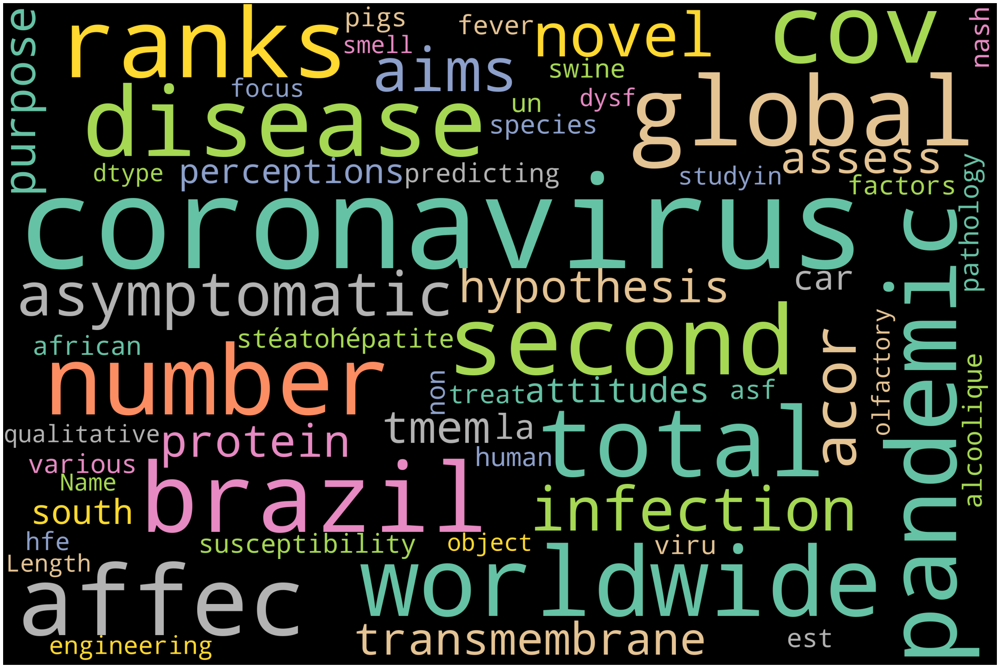

In [24]:
abstract_text = str(df.abstract)
body_tt_text = str(df.body_text)
# Import package
from wordcloud import WordCloud
# Generate word cloud
wordcloud = WordCloud(width = 3000, height = 2000, random_state=1, background_color='black', colormap='Set2', collocations=False, stopwords = stopwords_custom).generate(abstract_text)
# Plot
plot_cloud(wordcloud)

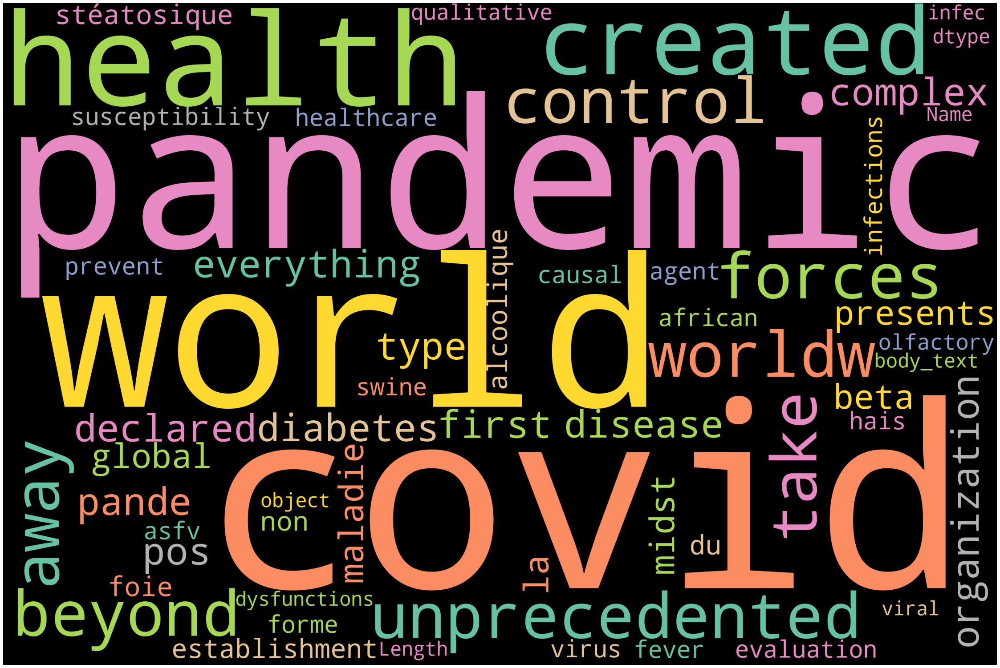

In [25]:
text = str(df.body_text)

# Import package
from wordcloud import WordCloud
# Generate word cloud
wordcloud = WordCloud(width = 3000, height = 2000, random_state=1, background_color='black', colormap='Set2', collocations=False, stopwords = stopwords_custom).generate(text)
# Plot
plot_cloud(wordcloud)

In [26]:
# json_data_files = []
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         ifile = os.path.join(dirname, filename)
#         if ifile.split(".")[-1] == "json":
#             json_data_files.append(ifile)

In [27]:
# id2abstract = []
# for file in json_data_files[:1000]:   # Only load 1000 paper to reduce memory and run-time
#     with open(file,'r')as f:
#         doc = json.load(f)
#     id = doc['paper_id'] 
#     abstract = ''
#     try:
#         for item in doc['abstract']:
#             abstract = abstract + item['text']
            
#         id2abstract.append({id:abstract})
#     except KeyError:
#         None
    
# print ("All Research papers abstract's are loaded successfully!")    

In [28]:
# normalized_json = pd.json_normalize(all_json_files[:5])
# normalized_json

In [29]:
# df = normalized_json.reindex(columns=['paper_id', 'abstract', 'body_text'])
# df

In [30]:
# df = pd.DataFrame.from_dict(normalized_json, orient='columns')
# df

In [31]:
a = ['apple', 'b', 2]
b = []
b = b + [a]
b



[['apple', 'b', 2]]

# Data Preprocessing

In [32]:
def text_preprocessing(tokens, start=0, stop=-1):
    tokens = tokens[start:stop] 
    if '[SEP]' in tokens:
        sep_index = tokens.index('[SEP]')  
        tokens = tokens[sep_index + 1:]
    txt = ' '.join(tokens)          # Join all the tokens
    
    # Replace all the special characters which are unwanted
    txt = txt.replace(' ##', '')
    txt = txt.replace('##', '')
    
    txt = txt.strip()               # Remove unwanted spaces 
    txt = " ".join(txt.split())     # Join all the words
    
    # Remove unwanted space near the special charcters
    txt = txt.replace(' .', '.')
    txt = txt.replace('( ', '(')
    txt = txt.replace(' )', ')')
    txt = txt.replace(' - ', '-')
    
    txt_list = txt.split(' , ')     # Convert string to list of words seperated by comma
    txt = ''                        # Emptying the values in the variable 'txt' and keeping it as string type
    
    nTxtL = len(txt_list)           # Length of txt_list
    
    if nTxtL == 1:                  # If length of txt_list is 1 then display the first element in the list
        return txt_list[0]
    newList =[]                     # Empty list
    for i,t in enumerate(txt_list):
        if i < nTxtL -1:
            if t[-1].isdigit() and txt_list[i+1][0].isdigit():
                newList += [t,',']
            else:
                newList += [t, ', ']
        else:
            newList += [t]
    return ''.join(newList)

def extract_sentence(abstract,answer):
    abstract = abstract.lower() # Convert to lower case
    answer = answer.lower()
    split_byans = abstract.split(answer)  # list of sentences not words i.e., ['hlo B how r u'] not like ['hlo', 'B', 'how', 'r', 'u']
    if len(split_byans)==1:
        return split_byans[0][split_byans[0].rfind(". ")+1:]+" "+answer   # Combine abstract and answer
    else: 
        return split_byans[0][split_byans[0].rfind(". ")+1:]+" "+answer+split_byans[1][:split_byans[1].find(". ")+1]

In [33]:
x = "hello muthu how are you"
z = x.split()
z

['hello', 'muthu', 'how', 'are', 'you']

In [34]:
x = "hello muthu how are you"
y = "good how about you"
z = x.split(y)
z

['hello muthu how are you']

In [35]:
len(z)

1

In [36]:
if len(z) == 1:
    print(z[0][z[0].rfind(". ")+1:]+" "+y)
else: 
    print(z[0][z[0].rfind(". ")+1:]+" "+ y +z[1][:z[1].find(". ")+1])

hello muthu how are you good how about you


# Load Qustion Answering (QA) using BERT 

In [37]:
from transformers import BertForQuestionAnswering # Bert QA model
from transformers import BertTokenizer
import torch

device = torch.device("cuda")
model_QA = BertForQuestionAnswering.from_pretrained('bert-large-uncased-whole-word-masking-finetuned-squad')
tokenizer_QA = BertTokenizer.from_pretrained('bert-large-uncased-whole-word-masking-finetuned-squad')
model_QA = model_QA.to(device)
model_QA = model_QA.eval()

In [38]:
from transformers import BartTokenizer, BartForConditionalGeneration, BartConfig

model = BartForConditionalGeneration.from_pretrained('facebook/bart-large-cnn')
tokenizer = BartTokenizer.from_pretrained('facebook/bart-large-cnn')

In [39]:
from transformers import pipeline
nlp = pipeline('question-answering')

## Summary Model function

In [65]:
def Summary_Model(pd,count,model):
    summary_text = ''
    total_abstract = ''
    for i in range(len(pd[:count])):
        abss, ans = pd.loc[i,['abstract_by_ans','Answer']].values
        total_abstract += (abss + ".")
    ARTICLE_TO_SUMMARIZE = total_abstract
    print(ARTICLE_TO_SUMMARIZE)
    # Display best answer to the article

    # Token the article, if larger than 1024, then split the article
#     tokens= tokenizer.tokenize(ARTICLE_TO_SUMMARIZE)
#     max_seq_length = 1024
#     longer = 0
#     all_tokens=[]
#     if len(tokens)>1024:
#         for i in range(0,len(tokens),max_seq_length):
#             tokens_a = tokens[i:i + max_seq_length]
#             one_token = tokenizer.batch_encode_plus([tokens_a], max_length = 1024, return_tensors = 'pt')
#             all_tokens.append(one_token)
    
    summary_text = summarizer(ARTICLE_TO_SUMMARIZE)
#     Summary_text = []
    
#     # Decode the model output as a summary text
#     def decode_text(sum_ids):
#         text =''
#         for g in sum_ids:
#             text = text + tokenizer.decode(g, skip_special_tokens=True, clean_up_tokenization_spaces=False)
#         return text
    
#     # Summary model
#     model = model.to(device)
#     model.eval()

#     for inputs in all_tokens:
#         summary_ids = model.generate(inputs['input_ids'].to(device), num_beams=2, max_length=1000, early_stopping=True)
#         Summary_text = Summary_text + " " + decode_text(summary_ids) 
    
#     if Summary_text == '':
#         Summary_text = "Can't find the answer. Try re-phrasing your question."
#     #print (Summary_text)
    return summary_text

In [66]:
ques = ["what are the presence of comorbidities worsen the effects of the infection?"]
ans_pd,Summary_text_3 = ANS_Model(ques,len(id2abstract[:50]))
Summary_text_3

Your max_length is set to 142, but you input_length is only 103. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=50)


| seasonal influenza  vaccines lack efficacy against drifted or pandemic influenza strains.. coronaviruses (covs) are by far the largest group of known positive-sense rna viruses having an extensive range of natural hosts. in the past few decades, newly evolved coronaviruses have posed a global threat to public health.. bmj open publishes all reviews undertaken for accepted manuscripts..we report  a laboratory-confirmed case of severe acute respiratory syndrome (sars) in a pregnant woman..


[{'summary_text': ' seasonal influenza  vaccines lack efficacy against drifted or pandemic influenza strains . coronaviruses (covs) are by far the largest group of known positive-sense rna viruses having an extensive range of natural hosts . in the past few decades, newly evolved coronaviraluses have posed a global threat to public health .'}]

## QA Model function

In [58]:
summarizer = pipeline("summarization")

In [ ]:
for i, text in enumerate(df):
    summary_text = summarizer(df['abstract'].iloc[i], max_length=100, min_length=30)
    print(summary_text)
    print()
    pd['abstract'].iloc[i] = summary_text[i]['summary_text']
    print(summary_text[i]['summary_text'])

In [41]:
len(id2abstract)

1389

In [42]:
count = 10
len((id2abstract[:count]))

10

In [43]:
id2body

[{'a0d063dca746b135afe0451ce0b3bb1e06cf15ae': "The COVID-19 pandemic has created an unprecedented worldwide strain on health care. Although early reports from east Asia and Europe meant that Brazil was well positioned to implement non-pharmaceutical interventions, Brazilians, like those in many low-income and middle-income countries, have limited access to testing and social security. 1, 2 Difficulties in testing make it harder to assess the growth of the pandemic, while limited access to social security can lead a sizable fraction of society to not engage in physical distancing. This situation has been further complicated by an unstable federal government 3 that has failed to support measures such as physical distancing and attempted to downplay the gravity of the pandemic, as has been well publicised in the media. 4 Worryingly, as of June 23, 2020, Brazil ranks second worldwide in total number of COVID-19 cases and deaths, with a high estimated rate of transmission (effective reprodu

In [44]:
def pipeline_question(question,count=0):
    question = ques
    answer_all=[]
    cons_all = []
    ID_list = []
    abstract_list = []
    result = []
    document = ''
    #print(len(id2abstract[:count]))

    for i in range(len(id2body[:count])):
        document = document + list(id2body[i].values())[0]
        #result[i] = nlp(context=document, question=question)
        #print(result[i])
    context="COVID-19 is caused by a coronavirus called SARS-CoV-2."
    nlp(context=document, question=question)

In [45]:
ques = "What is COVID19 called?"
pipeline_question(ques,1)

/opt/conda/lib/python3.7/site-packages/transformers/tokenization_utils_base.py:1423: FutureWarning: The `max_len` attribute has been deprecated and will be removed in a future version, use `model_max_length` instead.
  FutureWarning,


In [46]:
nlp({
    'question':"what is my name?",
    'context': "I am Hussain, I am a graduate student"
})

/opt/conda/lib/python3.7/site-packages/transformers/tokenization_utils_base.py:1423: FutureWarning: The `max_len` attribute has been deprecated and will be removed in a future version, use `model_max_length` instead.
  FutureWarning,


{'score': 0.988496720790863, 'start': 5, 'end': 13, 'answer': 'Hussain,'}

In [47]:
question="what is my name?"
context="I am Hussain, I am a graduate student"
nlp(context=context, question=question)

/opt/conda/lib/python3.7/site-packages/transformers/tokenization_utils_base.py:1423: FutureWarning: The `max_len` attribute has been deprecated and will be removed in a future version, use `model_max_length` instead.
  FutureWarning,


{'score': 0.988496720790863, 'start': 5, 'end': 13, 'answer': 'Hussain,'}

In [48]:
def ANS_Model(ques,count):
    question = ques
    answer_all=[]
    cons_all = []
    ID_list = []
    abstract_list = []
    #print(len(id2abstract[:count]))

    for i in range(len(id2abstract[:count])):
        document = list(id2abstract[i].values())[0]
        answer,confidence,abst_doc=BERTSQuADPrediction(document, question)
        #finebert22(document, question)
        #print(document)
#         print(answer)
        #print(i)
#         ID = list(id2abstract[i].keys())[0]
#         nWords = len(document.split()) # check how many tokens
#         input_ids_all = tokenizer_QA.encode(question, document) # Encode the document to ids
#         tokens_all = tokenizer_QA.convert_ids_to_tokens(input_ids_all)
#         if len(input_ids_all) > 512:
#             nFirstPiece = int(np.ceil(nWords/2))
#             docSplit = document.split()
#             docPieces = [' '.join(docSplit[:nFirstPiece]), ' '.join(docSplit[nFirstPiece:])]
#             input_ids = [tokenizer_QA.encode(question, dp) for dp in docPieces]
#         else:
#             input_ids = [input_ids_all]   

#         answers = []
#         cons = []
#         for iptIds in input_ids:
#             tokens = tokenizer_QA.convert_ids_to_tokens(iptIds)
#             sep_index = iptIds.index(tokenizer_QA.sep_token_id)
#             num_seg_a = sep_index + 1
#             num_seg_b = len(iptIds) - num_seg_a
#             segment_ids = [0]*num_seg_a + [1]*num_seg_b
#             assert len(segment_ids) == len(iptIds)
#             number_ids = len(segment_ids)

#             if number_ids < 512:
#                 start_scores, end_scores = model_QA(torch.tensor([iptIds]).to(device), 
#                                          token_type_ids=torch.tensor([segment_ids]).to(device))
#             else:
#                 #print('****** warning only considering first 512 tokens, document is '+str(nWords)+' words long.  There are '+str(number_ids)+ ' tokens')
#                 absTooLong = True
#                 start_scores, end_scores = model_QA(torch.tensor([iptIds[:512]]).to(device), 
#                                          token_type_ids=torch.tensor([segment_ids[:512]]).to(device))
            
#             start_scores = start_scores[:,1:-1]
#             end_scores = end_scores[:,1:-1]
#             answer_start = torch.argmax(start_scores)
#             answer_end = torch.argmax(end_scores)
#             answer = text_preprocessing(tokens, answer_start, answer_end+2)

#             if answer.startswith('. ') or answer.startswith(', '):
#                 answer = answer[2:]

#             c = start_scores[0,answer_start].item() + end_scores[0,answer_end].item()
#             answers.append(answer)
#             cons.append(c)
        

#         maxC = max(cons)
#         iMaxC = [i for i, j in enumerate(cons) if j == maxC][0]
#         confidence = cons[iMaxC]
#         print(cons[iMaxC])
#         answer = answers[iMaxC]
#         #print(answers[iMaxC])

#         sep_index = tokens_all.index('[SEP]')
#         full_txt_tokens = tokens_all[sep_index+1:]

#         abs_returned = text_preprocessing(full_txt_tokens)
        if answer!="":
            answer_all.append(answer)
            cons_all.append(confidence)
            #print(cons_all)
            #ID_list.append(ID)
            #print (answer)
            abstract_list.append(abst_doc)
            #print (confidence)
        
            
    ans_pd = pd.DataFrame({"abstract":abstract_list,"Answer":answer_all,"Confident":cons_all})
    ans_pd = ans_pd.sort_values(by=['Confident'],ascending=False)
    #print("answer_pd"+(ans_pd))
#     print(ans_pd)
#     return ans_pd
    gc.collect()
    extrac_list = []
    for i in range(len(ans_pd)):
        abss, ans = ans_pd.loc[i,['abstract','Answer']].values
        extract_sen = extract_sentence(abss,ans)
        
        extrac_list.append(extract_sen)
        #print((extrac_list))
    ans_pd['abstract_by_ans'] = extrac_list
    #print(ans_pd)
    ans_pd = ans_pd.sort_values(by=['Confident'],ascending=False).reset_index(drop=True)
    Summary_text = Summary_Model(ans_pd,100,model)
    return ans_pd,Summary_text

In [49]:
# def finebert(document, question):
#     answer=""
#     input_ids = tokenizer_QA.encode(question, document)
#     sep_index = input_ids.index(tokenizer_QA.sep_token_id) # The number of segment A tokens includes the [SEP] token istelf.
#     num_seg_a = sep_index + 1
#     # The remainder are segment B.
#     num_seg_b = len(input_ids) - num_seg_a
#     # Construct the list of 0s and 1s.
#     segment_ids = [0]*num_seg_a + [1]*num_seg_b
#     # There should be a segment_id for every input token.
#     assert len(segment_ids) == len(input_ids)
#     # Run our example through the model.
#     start_scores, end_scores = model_QA(torch.tensor([input_ids].to(torch_device), # The tokens representing our input text.
#                                  token_type_ids=torch.tensor([segment_ids]).to(torch_device)     # The segment IDs to differentiate question from answer_text
#     #start_scores = start_scores[:,1:-1]
#     answer_start = torch.argmax(start_scores)
#     answer_end = torch.argmax(end_scores)
#     answer = ' '.join(tokens[answer_start:answer_end+1])

#     answer = tokens[answer_start]

# # Select the remaining answer tokens and join them with whitespace.
#     for i in range(answer_start + 1, answer_end + 1):
#                                                      # If it's a subword token, then recombine it with the previous token.
#                                                      if tokens[i][0:2] == '##':
#                                                      answer += tokens[i][2:]
#                                                         # Otherwise, add a space then the token.
#                                                      else:                                                   
#                                                      answer += ' ' + tokens[i]

#     return answer
    

SyntaxError: invalid syntax (<ipython-input-49-a3039d806745>, line 16)

In [53]:
def BERTSQuADPrediction(document, question):
    ## we need to rewrite this function so that it chuncks the document into 250-300 word segments with
    ## 50 word overlaps on either end so that it can understand and check longer abstracts
    nWords = len(document.split())
    input_ids_all = tokenizer_QA.encode(question, document)
    tokens_all = tokenizer_QA.convert_ids_to_tokens(input_ids_all)
    overlapFac = 1.1
    if len(input_ids_all)*overlapFac > 2048:
        nSearchWords = int(np.ceil(nWords/5))
        quarter = int(np.ceil(nWords/4))
        docSplit = document.split()
        docPieces = [' '.join(docSplit[:int(nSearchWords*overlapFac)]), 
                     ' '.join(docSplit[quarter-int(nSearchWords*overlapFac/2):quarter+int(quarter*overlapFac/2)]),
                     ' '.join(docSplit[quarter*2-int(nSearchWords*overlapFac/2):quarter*2+int(quarter*overlapFac/2)]),
                     ' '.join(docSplit[quarter*3-int(nSearchWords*overlapFac/2):quarter*3+int(quarter*overlapFac/2)]),
                     ' '.join(docSplit[-int(nSearchWords*overlapFac):])]
        input_ids = [tokenizer_QA.encode(question, dp) for dp in docPieces]        
        
    elif len(input_ids_all)*overlapFac > 1536:
        nSearchWords = int(np.ceil(nWords/4))
        third = int(np.ceil(nWords/3))
        docSplit = document.split()
        docPieces = [' '.join(docSplit[:int(nSearchWords*overlapFac)]), 
                     ' '.join(docSplit[third-int(nSearchWords*overlapFac/2):third+int(nSearchWords*overlapFac/2)]),
                     ' '.join(docSplit[third*2-int(nSearchWords*overlapFac/2):third*2+int(nSearchWords*overlapFac/2)]),
                     ' '.join(docSplit[-int(nSearchWords*overlapFac):])]
        input_ids = [tokenizer_QA.encode(question, dp) for dp in docPieces]        
        
    elif len(input_ids_all)*overlapFac > 1024:
        nSearchWords = int(np.ceil(nWords/3))
        middle = int(np.ceil(nWords/2))
        docSplit = document.split()
        docPieces = [' '.join(docSplit[:int(nSearchWords*overlapFac)]), 
                     ' '.join(docSplit[middle-int(nSearchWords*overlapFac/2):middle+int(nSearchWords*overlapFac/2)]),
                     ' '.join(docSplit[-int(nSearchWords*overlapFac):])]
        input_ids = [tokenizer_QA.encode(question, dp) for dp in docPieces]
    elif len(input_ids_all)*overlapFac > 512:
        nSearchWords = int(np.ceil(nWords/2))
        docSplit = document.split()
        docPieces = [' '.join(docSplit[:int(nSearchWords*overlapFac)]), ' '.join(docSplit[-int(nSearchWords*overlapFac):])]
        input_ids = [tokenizer_QA.encode(question, dp) for dp in docPieces]
    else:
        input_ids = [input_ids_all]
    absTooLong = False    
    
    answers = []
    cons = []
    for iptIds in input_ids:
        tokens = tokenizer_QA.convert_ids_to_tokens(iptIds)
        #print(tokens)
        sep_index = iptIds.index(tokenizer_QA.sep_token_id)
        num_seg_a = sep_index + 1
        num_seg_b = len(iptIds) - num_seg_a
        segment_ids = [0]*num_seg_a + [1]*num_seg_b
        assert len(segment_ids) == len(iptIds)
        n_ids = len(segment_ids)

        if n_ids < 512:
            start_scores, end_scores = model_QA(torch.tensor([iptIds]).to(torch_device), 
                                     token_type_ids=torch.tensor([segment_ids]).to(torch_device))
        else:
#             print('****** warning only considering first 512 tokens, document is '+str(nWords)+' words long.  There are '+str(n_ids)+ ' tokens')
            absTooLong = True
            start_scores, end_scores = model_QA(torch.tensor([iptIds[:512]]).to(torch_device), 
                                     token_type_ids=torch.tensor([segment_ids[:512]]).to(torch_device))
        start_scores = start_scores[:,1:-1]
        end_scores = end_scores[:,1:-1]
        answer_start = torch.argmax(start_scores)
        answer_end = torch.argmax(end_scores)
        answer = text_preprocessing(tokens, answer_start, answer_end+2)
    
        if answer.startswith('. ') or answer.startswith(', '):
            answer = answer[2:]
            #print(answer)
            
        c = start_scores[0,answer_start].item()+end_scores[0,answer_end].item()
        answers.append(answer)
        #print("From"+answer)
        cons.append(c)
    
    maxC = max(cons)
    iMaxC = [i for i, j in enumerate(cons) if j == maxC][0]
    confidence = cons[iMaxC]
    answer = answers[iMaxC]
    
    
    sep_index = tokens_all.index('[SEP]')
    full_txt_tokens = tokens_all[sep_index+1:]
    
    abs_returned = text_preprocessing(full_txt_tokens)

    ans={}
    ans['answer'] = answer
    if answer.startswith('[CLS]') or answer_end.item() < sep_index or answer.endswith('[SEP]'):
        ans['confidence'] = -1000000
    else:
        ans['confidence'] = confidence
    ans['abstract_bert'] = abs_returned
    ans['abs_too_long'] = absTooLong
    return ans['answer'],ans['confidence'],ans['abstract_bert']

In [51]:
task_dic={}

all_tasks=[
    'What is known about transmission, incubation, and environmental stability?',
    'What do we know about COVID-19 risk factors?',
    'What do we know about virus genetics, origin, and evolution?',
    'What do we know about vaccines and therapeutics?',
    'What has been published about medical care?',
    'What do we know about non-pharmaceutical interventions?',
    'What do we know about diagnostics and surveillance?',
    'What has been published about ethical and social science considerations?',
    'What has been published about information sharing and inter-sectoral collaboration?'
    'What is COVID19'
]

#1 task
question_list = []
question_list.append("What is COVID19")
question_list.append("What is known about transmission, incubation, and environmental stability for the 2019-nCoV")
question_list.append("What do we know about natural history, transmission, and diagnostics for the 2019-nCoV")
question_list.append("What have we learned about infection prevention and control for the 2019-nCoV")
question_list.append("What is the range of incubation periods for the 2019-nCoV in humans")
question_list.append("How does temperature and humidity affect the tramsmission of 2019-nCoV")
question_list.append("How long can 2019-nCoV remain viable on inanimate, environmental, or common surfaces")
question_list.append("What types of inanimate or environmental surfaces affect transmission, survival, or  inactivation of 2019-nCov")
question_list.append("What is tools and studies to monitor phenotypic change and potential adaptation of the virus")
task_dic[all_tasks[0]] = question_list

In [ ]:
ques = ["What is known about transmission, incubation, and environmental stability for the 2019-nCoV"]
ans_pd,Summary_text_1 = ANS_Model(ques,len(id2body[:22]))
Summary_text_1

In [56]:
ques = ["vaccines lack efficacy against drifted or pandemic influenza strains"]
ans_pd,Summary_text_3 = ANS_Model(ques,len(id2abstract[:1000]))
Summary_text_3

Truncation was not explicitly activated but `max_length` is provided a specific value, please use `truncation=True` to explicitly truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.


| seasonal influenza  vaccines lack efficacy against drifted or pandemic influenza strains.. coronaviruses (covs) are by far the largest group of known positive-sense rna viruses having an extensive range of natural hosts. in the past few decades, newly evolved coronaviruses have posed a global threat to public health.. bmj open publishes all reviews undertaken for accepted manuscripts..we report  a laboratory-confirmed case of severe acute respiratory syndrome (sars) in a pregnant woman..  classical inhibitors of herpesvirus replication cause chain termination during viral dna replication.. using the model we identified the dominant driver of pre-symptomatic transmission, which was found to  be contact route, while the contribution of the airborne route is negligible..the idea of a global orthodontic organization,  the world federation of orthodontists (wfo), made up of national and regional orthodontic organizations, was realized in 1995 in san francisco at the 4th international orth

ValueError: too many values to unpack (expected 2)

In [67]:
ques = ["What is range of incubation period for coronavirus SARS-CoV-2 COVID-19 in humans"]
ans_pd,Summary_text_2 = ANS_Model(ques,len(id2abstract[:100]))
Summary_text_2

| seasonal influenza  vaccines lack efficacy against drifted or pandemic influenza strains.. coronaviruses (covs) are by far the largest group of known positive-sense rna viruses having an extensive range of natural hosts. in the past few decades, newly evolved coronaviruses have posed a global threat to public health.. bmj open publishes all reviews undertaken for accepted manuscripts..we report  a laboratory-confirmed case of severe acute respiratory syndrome (sars) in a pregnant woman..  classical inhibitors of herpesvirus replication cause chain termination during viral dna replication.. using the model we identified the dominant driver of pre-symptomatic transmission, which was found to  be contact route, while the contribution of the airborne route is negligible..the idea of a global orthodontic organization,  the world federation of orthodontists (wfo), made up of national and regional orthodontic organizations, was realized in 1995 in san francisco at the 4th international orth

[{'summary_text': ' coronaviruses (covs) are by far the largest group of known positive-sense rna viruses having an extensive range of natural hosts .  classical inhibitors of herpesvirus replication cause chain termination during viral dna replication . The dominant driver of pre-symptomatic transmission was found to be contact route, while the contribution of the airborne route is negligible .'}]

In [ ]:
ques = ["What is range of incubation period for coronavirus SARS-CoV-2 COVID-19 in humans"]
res=pipeline_question(ques,10)

In [71]:
ques = ["What is Covid19?"]
ans_pd,Summary_text_3 = ANS_Model(ques,len(id2abstract[:50]))
Summary_text_3

Your max_length is set to 142, but you input_length is only 103. You might consider decreasing max_length manually, e.g. summarizer('...', max_length=50)


| seasonal influenza  vaccines lack efficacy against drifted or pandemic influenza strains.. coronaviruses (covs) are by far the largest group of known positive-sense rna viruses having an extensive range of natural hosts. in the past few decades, newly evolved coronaviruses have posed a global threat to public health.. bmj open publishes all reviews undertaken for accepted manuscripts..we report  a laboratory-confirmed case of severe acute respiratory syndrome (sars) in a pregnant woman..


[{'summary_text': ' seasonal influenza  vaccines lack efficacy against drifted or pandemic influenza strains . coronaviruses (covs) are by far the largest group of known positive-sense rna viruses having an extensive range of natural hosts . in the past few decades, newly evolved coronaviraluses have posed a global threat to public health .'}]

In [73]:
sum_3=Summary_text_3[0]['summary_text']

In [76]:
type (sum_3)

str

# Question 1. Baseline Model Performance Metrics

### Write about which metrics you have chosen for evaluating the performance of your model. Why have you chosen these metrics? Why does it makes sense to use these metrics for your chosen problem? 

##### Baseline Model Performance Metrics: 

We have chosen BLEU (Bilingual evaluation understudy) score & BERT (Bidirectional Encoder Representations  from Transformers) score for our model performance metrics. The reason behind the selection is described below.

BLEU score: It can be used to evaluate your generated text against a reference text. NLTK provides the sentence_bleu() function for evaluating a generated sentence against one or more reference sentences. BLEU computes the modified precision metric using n-grams. But one problem with BLEU scores is that they tend to favor short translations but not long.

BERT score: It uses the pre-trained contextual embeddings from BERT model and matches the words in candidate (predicted) and reference (actual) sentences using cosine similarity. This will provide better model evaluation since the Cosine similarity is a measure of similarity between two non-zero vectors of the predicted and actual results. It calculates the cosine of the angle between the results. So the evaluation of the model will be better when compared to BLEU.

In [70]:
from nltk.translate.bleu_score import sentence_bleu   # Library to compare two sentences and calculate score using BLEU
from nltk.tokenize import word_tokenize  # NLTK library to tokenize the expected and acquired results

def compare_bleu(result, expected):    
    token_res = word_tokenize(result)    # Tokenize the acquired results
    token_exp = word_tokenize(expected)  # Tokenize the expected results
    score = sentence_bleu(token_res, token_exp)   # Compare two sentences and calculate score
    print("The BLEU score of accuracy is: ", score)

### For better results, the expected answers used in the model are acquired from Centers for Disease Control & Prevention (CDC) and US Food & Drug Association (FDA)

- CDC - https://www.cdc.gov/coronavirus/2019-ncov/faq.html

- FDA - https://www.fda.gov/emergency-preparedness-and-response/coronavirus-disease-2019-covid-19/covid-19-frequently-asked-questions

In [74]:
# Define the expected answer to a new variable
expected_Summary_text_2 = "The incubation period for COVID-19 is thought to extend to 14 days, with a median time of 4-5 days from exposure to symptoms onset. One study reported that 97.5% of persons with COVID-19 who develop symptoms will do so within 11.5 days of SARS-CoV-2 infection."
expected_Summary_text_3 = "Coronavirus disease 2019 (COVID-19) is a respiratory illness that can spread from person to person. CDC has information on COVID-19 symptoms and caring for yourself and others. COVID-19 is a new disease, caused by a novel (or new) coronavirus that has not previously been seen in humans. A novel coronavirus is a new coronavirus that has not been previously identified. The virus causing coronavirus disease 2019 (COVID-19), is not the same as the coronaviruses that commonly circulate among humans and cause mild illness, like the common cold."

In [ ]:
compare_bleu(Summary_text_2, expected_Summary_text_2)

In [77]:
compare_bleu(expected_Summary_text_3, sum_3)

The BLEU score of accuracy is:  0.5542089483371553


/opt/conda/lib/python3.7/site-packages/nltk/translate/bleu_score.py:490: UserWarning: 
Corpus/Sentence contains 0 counts of 2-gram overlaps.
BLEU scores might be undesirable; use SmoothingFunction().
  warnings.warn(_msg)


In [ ]:
# !pip install --upgrade pip  # ensures that pip is current
# !git clone https://github.com/google-research/bleurt.git
# !cd bleurt
# !pip install bleurt/requirements.txt
# !pip install .

In [ ]:
# !python -m bleurt.score \
#   -candidate_file=bleurt/test_data/candidates \
#   -reference_file=bleurt/test_data/references \
#   -bleurt_checkpoint=bleurt/test_checkpoint \
#   -scores_file=scores

In [ ]:
# from bleurt import score

# checkpoint = "bleurt/test_checkpoint"
# references = ["This is a test."]
# candidates = ["This is the test."]

# scorer = score.BleurtScorer(checkpoint)
# scores = scorer.score(references, candidates)
# assert type(scores) == list and len(scores) == 1
# print(scores)

## ROUGE Score


Ref: http://www.ccs.neu.edu/home/vip/teach/DMcourse/5_topicmodel_summ/notes_slides/What-is-ROUGE.pdf

In [78]:
# Thanks to https://pypi.org/project/rouge-score/
!pip install rouge-score

In [79]:
from rouge_score import rouge_scorer

scorer = rouge_scorer.RougeScorer(['rouge1', 'rougeL'], use_stemmer=True)
scores = scorer.score(expected_Summary_text_3, sum_3)
scores

{'rouge1': Score(precision=0.75, recall=0.6666666666666666, fmeasure=0.7058823529411765),
 'rougeL': Score(precision=0.625, recall=0.5555555555555556, fmeasure=0.5882352941176471)}

# Question.2 Baseline Model Performance Results

### How does your model perform on the metrics you have chosen?

The model performed half way better (atleast 50% accuracy) when comparing the predicted and actual results. But the BLEU score is calculated based on the n-gram precision. Also, in the Question Answering model, the n-gram precision doesn't give the best model evaluation since, when an answer is generated, it should match the context meaning of the actual and predicted sentences to provide the correct accuracy score.

In this case, we can rely on BERT score, which will evaluate the model performance based on the word embeddings and cosine similarity. The vectorized score will give better contextual meaning.

## Further tasks to be continued

Planning to use BERT-SCORE to calculate the accuracy score of the model because BERTScore leverages the pre-trained contextual embeddings from BERT and matches words in candidate (predicted) and reference (actual) sentences by cosine similarity. It has been shown to correlate with human judgment on sentence-level and system-level evaluation. Moreover, BERTScore computes precision, recall, and F1 measure, which can be useful for evaluating different language generation tasks.


#### This image shows the working flow of BERT Score
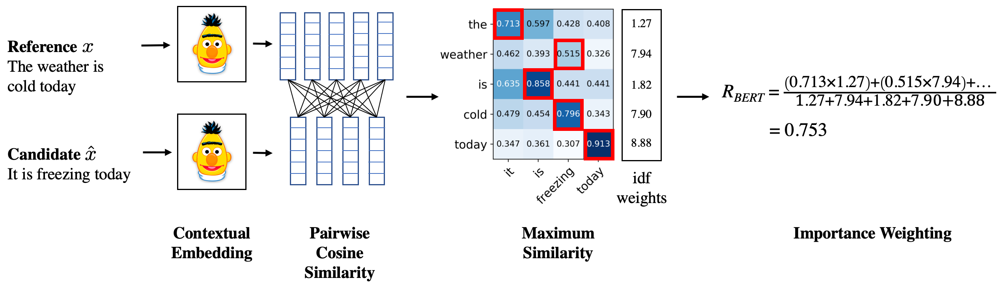

In [ ]:
# !pip install bert-score

In [ ]:
# bert-score -r example/refs.txt -c example/hyps.txt --lang en

# References

- BERTScore: https://github.com/Tiiiger/bert_score
- BLEU Score: https://machinelearningmastery.com/calculate-bleu-score-for-text-python/#:~:text=Crash%2DCourse%20Now-,Bilingual%20Evaluation%20Understudy%20Score,in%20a%20score%20of%200.0.
- QA Using bert pretrained model by SQuAD: https://github.com/google-research/bert
- All tasks list: https://www.kaggle.com/allen-institute-for-ai/CORD-19-research-challenge/tasks
- BERT model: https://www.kaggle.com/dirktheeng/anserini-bert-squad-for-semantic-corpus-search
- Dataset: https://www.kaggle.com/allen-institute-for-ai/CORD-19-research-challenge